In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

#Descargamos los datasets de la página de Tensorflow
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised = True, with_info=True)

#as_supervised=True: indica que se quieren cargar los datos en forma de tuplas (entrada, objetivo), donde la entrada es una imagen y el objetivo es un entero que indica si la imagen es de un gato o un perro.
#with_info=True: indica que se quiere cargar también los metadatos del conjunto de datos, que contienen información adicional como el número de ejemplos de entrenamiento y prueba, el tamaño de las imágenes, entre otros.

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteD0LHUC/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [ ]:
metadatos

#Número exacto de datos :23,262

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path=PosixGPath('/tmp/tmpe9jbeu7jtfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
  

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

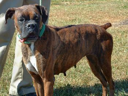
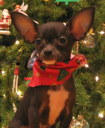
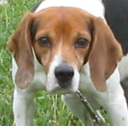
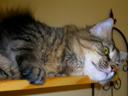
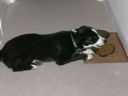

In [ ]:
tfds.as_dataframe(datos['train'].take(5), metadatos)

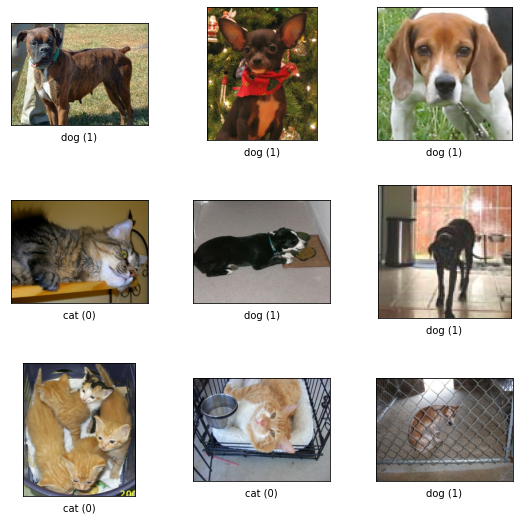

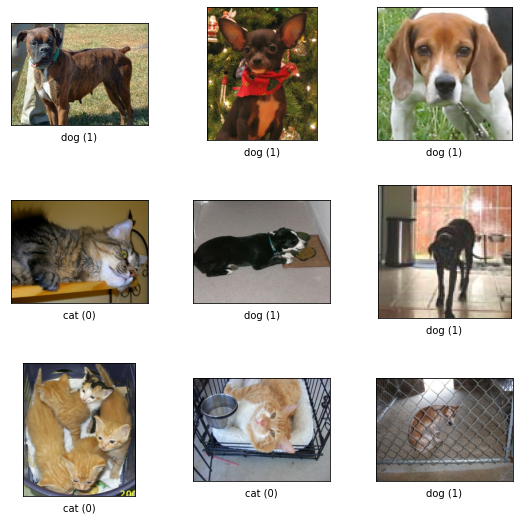

In [ ]:
tfds.show_examples(datos['train'], metadatos)

# **MANIPULACIÓN DEL SET DE DATOS**

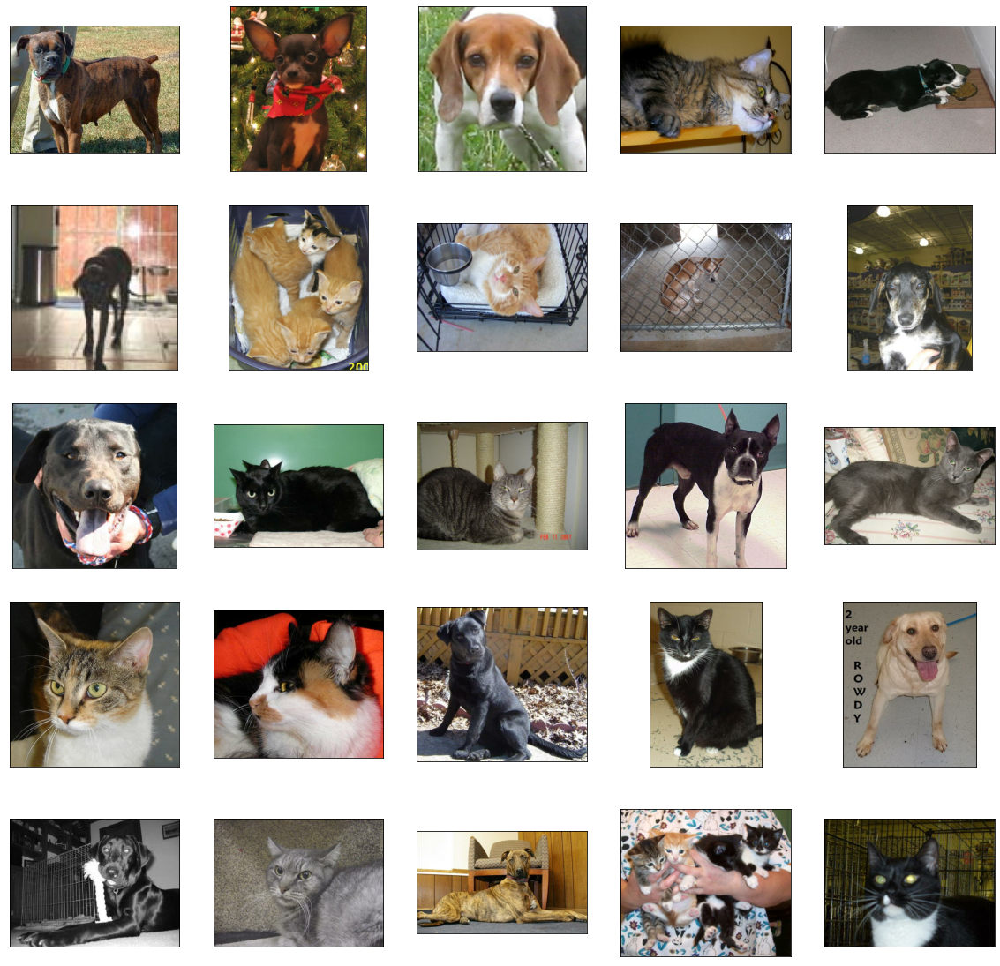

In [ ]:
#Para tener un mejor control de datos, usaremos Matplotlib
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5,5,i+1) #matriz 5x5
  plt.imshow(imagen) #mostrar la matriz
  plt.xticks([])
  plt.yticks([])

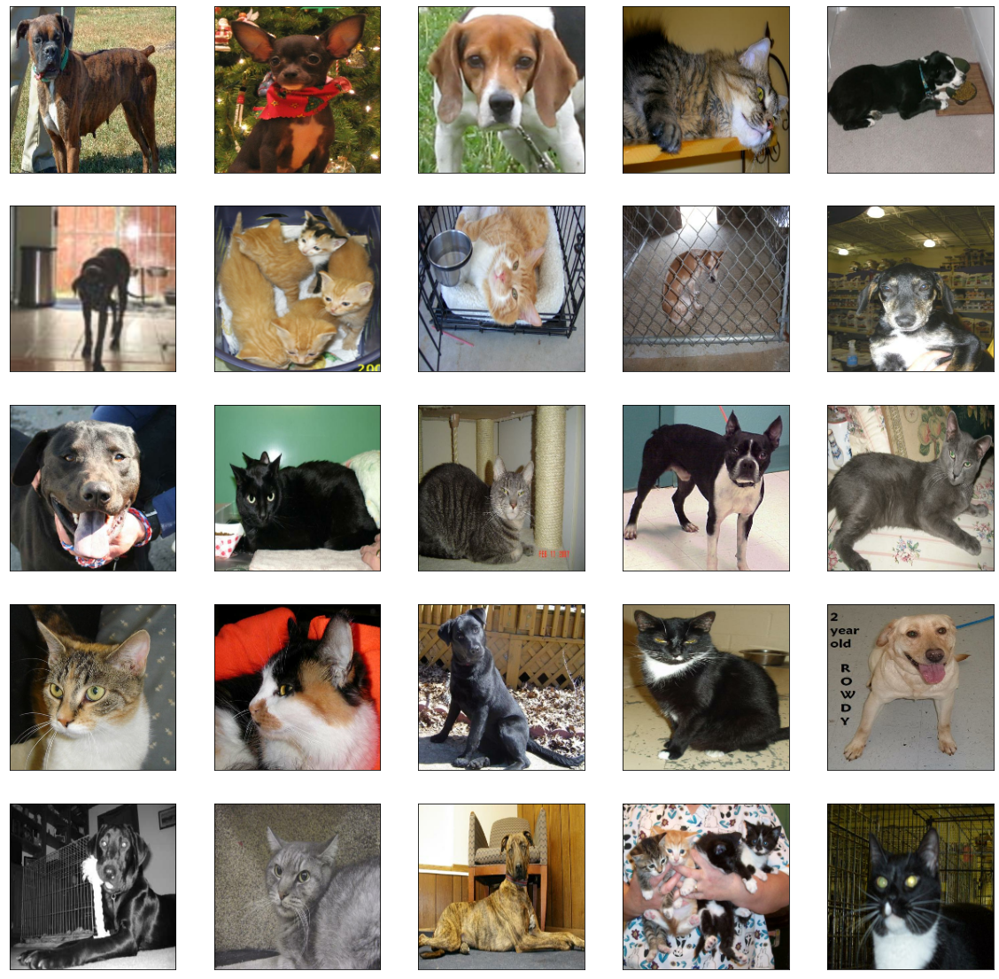

In [ ]:
#YA QUE USAREMOS LAS GRÁFICAS PARA LAS REDES NEURONALES, REDIMENSIONAREMOS LAS IMAGENES de ENTRADA UN MISMO TAMAÑAO, usando la librería cv2
import matplotlib.pyplot as plt
import cv2 #importamos

plt.figure(figsize=(20,20))

TAMANO_IMAG = 200 #fijamos a 200px y agregamos en "for"

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMAG, TAMANO_IMAG))
  plt.subplot(5,5,i+1) 
  plt.imshow(imagen) 
  plt.xticks([])
  plt.yticks([])

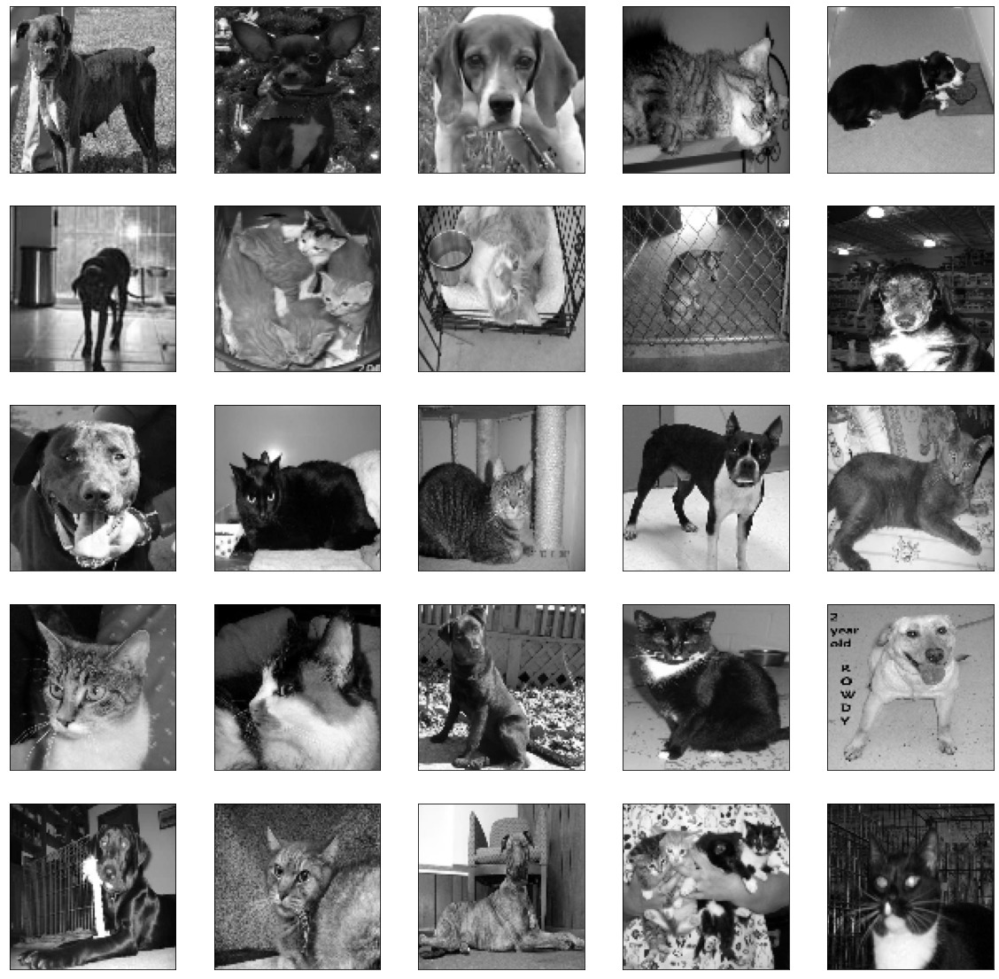

In [13]:
#Ahora pasaremos las imagenes a B/N porque son más rápidas de procesar, al igual que, mientras más grandes las img, más tardará la red en entrenar y predecir
import matplotlib.pyplot as plt
import cv2 

plt.figure(figsize=(20,20))

TAMANO_IMAG = 100 #Cambiamos de 200 pixeles a 100 px para que la red entrene mucho más rápido

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMAG, TAMANO_IMAG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)#Le ponemos la condición, se ponen verdes, agregamos en plt.imshow(cmap='gray')
  plt.subplot(5,5,i+1) 
  plt.imshow(imagen, cmap='gray') 
  plt.xticks([])
  plt.yticks([])

In [14]:
datos_entrenamiento = []

In [15]:
for i, (imagen, etiqueta) in enumerate(datos['train']): #Todos los datos del bloque anterior
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMAG, TAMANO_IMAG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMAG, TAMANO_IMAG, 1) #Las img las cambiamos para que Tensorflow no se confundamos, le damos las dimensiones 100x100x1, (1=un solo canal)
  datos_entrenamiento.append([imagen, etiqueta])

In [16]:
datos_entrenamiento[0]

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8), <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [17]:
len(datos_entrenamiento)

23262

# **PREPARAR LOS DATOS PARA EL ENTRENAMIENTO**

In [18]:
#Creamos 2 variables
X = [] #Serás todas las imágenes de entrada
y = [] #Nos dicen si es perro o gato

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
X #imprime listas de pixeles

In [20]:
#Normalizamos para tener valores entre 0 y 1, en lugar de 0 y 255
import numpy as np

X = np.array(X).astype(float) /255 #Dividir cada valor de píxel por 255 da los px en un rango de 0 a 1, lo que hace que los datos sean más fáciles de procesar lsos algoritmos

In [ ]:
X

In [ ]:
y

In [23]:
y = np.array(y) #Ésto hará que "y" tenga valores de 0 = gato, 1 = perro

In [24]:
y

array([1, 1, 1, ..., 0, 1, 0])

# **MODELOS A UTILIZAR**

In [25]:
X.shape

(23262, 100, 100, 1)

In [26]:
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')    
])

modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')    
])

In [27]:
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

# **1.- ENTRENAMIENTO DEL PRIMER MODELO**

In [28]:
#Visualizamos para ver gráficas de nuestro modelo importando callbacks
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
#Creamos un objeto para almacenar información del modelo, lo ajustamos con "fit"
tensorboardDenso = TensorBoard(log_dir='logs/denso') #carpeta para el modelo
modeloDenso.fit(X, y, batch_size=32,  #Usaremos un tamaño de lote de 32
                validation_split=0.15, #Dividiremos los datos en un conjunto de entrenamiento y validación (15%)
                epochs=100, #100 veces que el modelo recorrerá los datos del entrenmiento
                callbacks=[tensorboardDenso]) #Lista de objetos que se llamarán al final de cada época. En este caso al objeto TensorBoard creado anteriormente. 

## **Uso de TensorBoard en Colab**

In [30]:
%load_ext tensorboard

In [31]:
#En mi caso uso el navegador Brave, por ende desactivé la protección para habilitar tensorboard y evitar el error 403
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [ ]:
''' Primer gráfico (de precisión), se ve un mal:
 *los datos de entrenamiento(train)--> suben mucho porque recién se está aprendiendo
 *los datos de pérdida--> la precisión es mala'''

 ''' Segundo gráfico (de pérdida), se ve un mal:
 *los datos de entrenamiento(train)--> bajan, pareciendo que está aprendiendo muy rápido
 *los datos de pérdida--> hace referencia que no cuenta con buena precisión y para la vida real, no serviría de mucho'''

# **2.- ENTRENAMIENTO DEL SEGUNDO Y TERCER MODELO**

In [ ]:
#Creamos un objeto para almacenar información del modelo, lo ajustamos con "fit"
tensorboardCNN = TensorBoard(log_dir='logs/cnn') #carpeta para el modelo
modeloCNN.fit(X, y, batch_size=32,  #Usaremos un tamaño de lote de 32
                validation_split=0.15, #Dividiremos los datos en un conjunto de entrenamiento y validación (15%)
                epochs=100, #100 veces que el modelo recorrerá los datos del entrenmiento
                callbacks=[tensorboardCNN]) #Lista de objetos que se llamarán al final de cada época. En este caso al objeto TensorBoard creado anteriormente.

In [ ]:
#Creamos un objeto para almacenar información del modelo, lo ajustamos con "fit"
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2') #carpeta para el modelo
modeloCNN2.fit(X, y, batch_size=32,  #Usaremos un tamaño de lote de 32
                validation_split=0.15, #Dividiremos los datos en un conjunto de entrenamiento y validación (15%)
                epochs=100, #100 veces que el modelo recorrerá los datos del entrenmiento
                callbacks=[tensorboardCNN2]) #Lista de objetos que se llamarán al final de cada época. En este caso al objeto TensorBoard creado anteriormente.

# **AUMENTO DE DATOS**

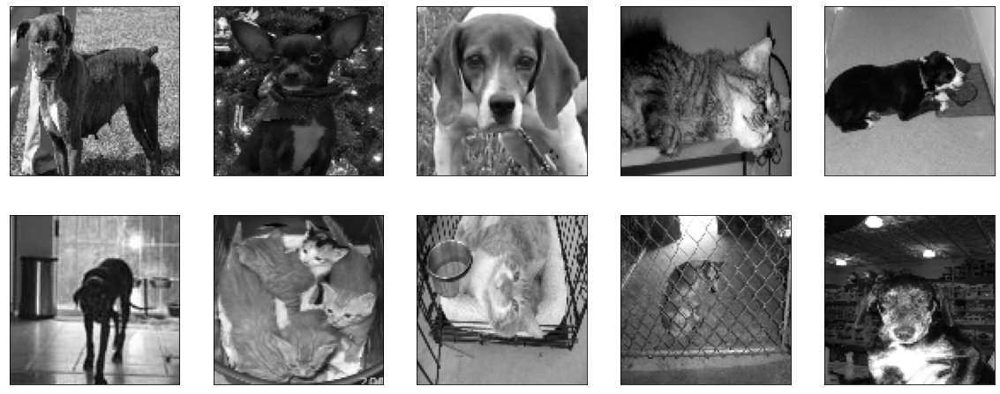

In [35]:
#Visualicemos nuestras gráficas, tal cual están, en la variable X
plt.figure(figsize=(20,8))
for i in range(10):
  plt.subplot(2,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100,100), cmap='gray')

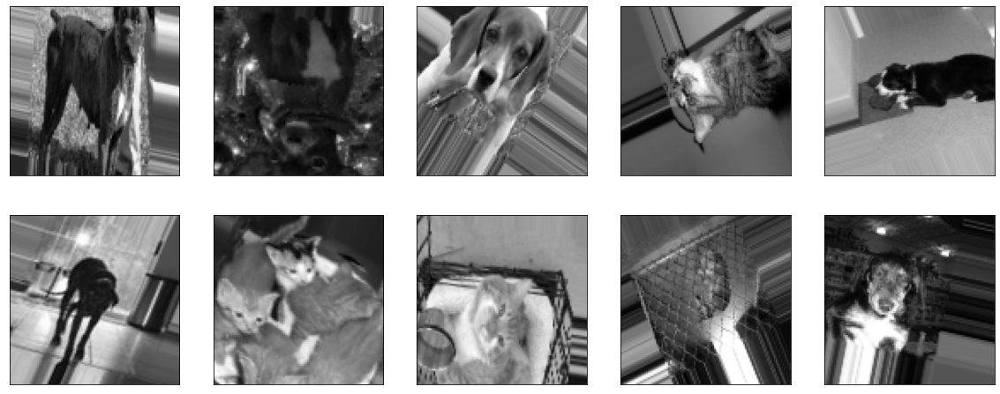

In [39]:
#Importamos el generador con aumento de datos
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Creamos un nuevo generador

datagen = ImageDataGenerator(
    rotation_range=30,  #rotación aleatoria de las imágenes
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7,1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100,100), cmap='gray')
  break

#**ENTRENAMIENTO DE LOS 3 MODELOS CON DATOS AUMENTADOS**

In [41]:
modeloDenso_AD = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')    
])

modeloCNN2_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')    
])

In [42]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [43]:
#En el anterior usamos 15% de los datos para entranamiento, ahora usaremos los 85% restantes
len(X)*.85  #19700 datos aprox
len(X) - 19700 #3562 datos aprox

X_entrenamiento = X[:19700]  #85% datos de entrenamiento
X_validacion = X[19700:]     #15% datos para pruebas

y_entrenamiento = y[:19700]  
y_validacion = y[19700:] 

In [44]:
#Creamos nuestro generador de datos transformador
data_gen_entrenamiento= datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
import gc
gc.collect()

In [ ]:
#Creamos un objeto para almacenar información del modelo
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD') #carpeta para el modelo
modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,  #Usaremos un tamaño de lote de 32
    validation_data =(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]
)

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD') #carpeta para el modelo
modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,  #Usaremos un tamaño de lote de 32
    validation_data =(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)

In [ ]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD') #carpeta para el modelo
modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,  #Usaremos un tamaño de lote de 32
    validation_data =(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

In [ ]:
#Usaremos la Red Neuronal Convolucional con datos aumentado, pero sin el dropout de 0.5 y con 100 neuronas
'''    Modelo CNN_AD   '''

#**EXPORTACIÓN DEL MODELO**

In [50]:
modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [51]:
#Instalamos la librería en colab
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 81.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.1/210.1 KB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 KB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.9/73.9 KB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 87.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.9/154.9 KB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.0/239.0 KB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.9/87.9 KB 11.7 MB/s eta 0:00:00
  Attempting uni

In [52]:
#Creamos una carpeta para exportar el archivo
!mkdir carpeta_salida

In [53]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_salida

2023-03-01 21:01:55.460237: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2023-03-01 21:01:55.460361: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2023-03-01 21:01:55.460381: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')